<a href="https://colab.research.google.com/github/anirudh027/proj/blob/master/VIISUALISATION.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.image as img
import seaborn as sns

import urllib.request
import json

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


## **JSON COVID**

In [ ]:
url="https://api.covid19india.org/states_daily.json"
urllib.request.urlretrieve(url,"covid.json")

('covid.json', <http.client.HTTPMessage at 0x7fbe09c51320>)

In [ ]:
data=pd.read_json("covid.json")

In [ ]:
data=data["states_daily"]

In [ ]:
data

0      {'an': '0', 'ap': '1', 'ar': '0', 'as': '0', '...
1      {'an': '0', 'ap': '0', 'ar': '0', 'as': '0', '...
2      {'an': '0', 'ap': '0', 'ar': '0', 'as': '0', '...
3      {'an': '0', 'ap': '0', 'ar': '0', 'as': '0', '...
4      {'an': '0', 'ap': '0', 'ar': '0', 'as': '0', '...
                             ...                        
382    {'an': '0', 'ap': '1127', 'ar': '8', 'as': '85...
383    {'an': '0', 'ap': '56', 'ar': '0', 'as': '4', ...
384    {'an': '4', 'ap': '4074', 'ar': '50', 'as': '1...
385    {'an': '6', 'ap': '1338', 'ar': '3', 'as': '10...
386    {'an': '0', 'ap': '54', 'ar': '0', 'as': '1', ...
Name: states_daily, Length: 387, dtype: object

In [ ]:
with open("covid.json") as d:
    cov=json.load(d)

In [ ]:
cov=cov["states_daily"]

In [ ]:
data=pd.json_normalize(cov)

In [ ]:
data.index=data["date"]
data.drop("date",axis=1,inplace=True)
data.index=pd.to_datetime(data.index)
data=data[data.status=="Confirmed"]
data.drop("status",axis=1,inplace=True)
data=data.apply(pd.to_numeric)

In [ ]:
data

,an,ap,ar,as,br,ch,ct,dd,dl,dn,ga,gj,hp,hr,jh,jk,ka,kl,la,ld,mh,ml,mn,mp,mz,nl,or,pb,py,rj,sk,tg,tn,tr,tt,un,up,ut,wb
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2020-03-14,0,1,0,0,0,0,0,0,7,0,0,0,0,14,0,2,6,19,0,0,14,0,0,0,0,0,0,1,0,3,0,1,1,0,81,0,12,0,0
2020-03-15,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,5,0,0,18,0,0,0,0,0,0,0,0,1,0,2,0,0,27,0,1,0,0
2020-03-16,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,3,0,0,6,0,0,0,0,0,1,0,1,0,0,1,0,0,15,0,0,1,0
2020-03-17,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,2,0,0,0,3,0,0,0,0,0,0,0,0,0,0,1,0,0,11,0,2,0,1
2020-03-18,0,0,0,0,0,0,0,0,2,0,0,0,0,1,0,1,5,0,8,0,3,0,0,0,0,0,1,1,0,3,0,8,1,0,37,0,2,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-07-16,4,2593,52,892,1385,16,198,0,1652,18,157,919,36,696,221,490,4169,722,5,0,8641,40,64,735,34,14,494,295,147,737,13,1676,4549,98,35468,-239,2058,197,1690
2020-07-17,0,2602,66,1218,1742,25,249,0,1462,32,196,949,40,795,313,601,3693,791,4,0,8308,26,36,704,10,40,718,348,89,615,32,1478,4538,118,34820,-754,1722,120,1894
2020-07-18,4,3963,41,1117,1667,31,243,0,1475,45,180,960,40,750,289,441,4537,593,8,0,8348,15,91,681,2,22,591,350,58,711,19,1284,4807,171,37411,-368,1873,174,2198


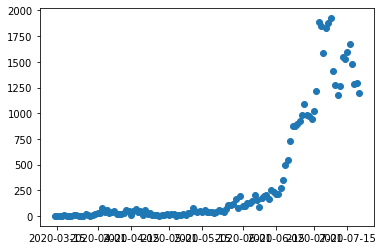

In [ ]:
plt.scatter(data.index,data.tg)
plt.show()

In [ ]:
co=data.copy()


In [ ]:
co=co[co.index>"2020-06-29"]
co.rolling(7).mean()

,an,ap,ar,as,br,ch,ct,dd,dl,dn,ga,gj,hp,hr,jh,jk,ka,kl,la,ld,mh,ml,mn,mp,mz,nl,or,pb,py,rj,sk,tg,tn,tr,tt,un,up,ut,wb
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2020-07-11,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-07-12,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-07-13,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-07-14,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-07-15,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-07-16,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-07-17,3.428571,2174.857143,39.142857,904.000000,1281.428571,17.714286,167.285714,0.0,1566.714286,19.714286,150.428571,908.714286,35.142857,694.714286,225.428571,409.857143,3099.571429,588.000000,12.428571,0.0,7732.571429,31.000000,31.142857,632.142857,8.000000,32.000000,593.428571,297.857143,80.000000,659.285714,19.000000,1467.428571,4378.000000,80.857143,31121.857143,-518.571429,1637.571429,104.142857,1557.428571
2020-07-18,4.000000,2482.000000,44.142857,987.142857,1418.285714,20.285714,192.714286,0.0,1523.000000,24.142857,159.428571,921.285714,39.285714,709.285714,246.000000,434.571429,3348.000000,603.000000,11.714286,0.0,7762.428571,22.285714,42.571429,651.714286,8.142857,32.857143,596.428571,315.000000,79.000000,678.857143,18.000000,1482.571429,4498.285714,100.857143,32501.000000,-464.714286,1706.285714,122.714286,1679.428571
2020-07-19,5.142857,2926.000000,54.285714,1027.571429,1439.142857,22.571429,189.428571,0.0,1471.285714,27.142857,172.000000,933.571429,44.000000,703.428571,256.000000,483.714286,3561.285714,658.142857,13.142857,0.0,8004.000000,22.142857,43.142857,709.714286,7.571429,30.571429,616.571429,325.571429,83.000000,720.285714,18.857143,1486.428571,4603.285714,117.714286,34090.857143,-432.000000,1824.428571,139.714286,1782.000000


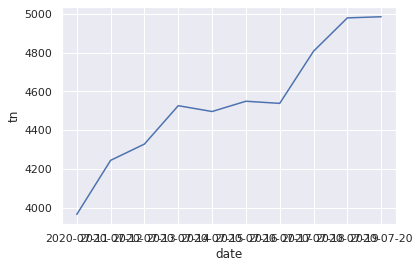

In [ ]:
sns.set(color_codes=True)
sns.lineplot(co.index,co.tn);


In [ ]:
data.style

In [ ]:
def ac(x):
    col="red" if x<0 else "white"
    return "color:"+col

In [ ]:
data.style.applymap(ac)

In [ ]:
data.style.background_gradient(cmap="Reds",axis=1)

In [ ]:
data[["dl"]].style.bar(color="blue")

## SEABORN

In [ ]:
sns.set(color_codes=True)

In [ ]:
x=np.random.randn(1000)
y=np.random.uniform(size=1000)

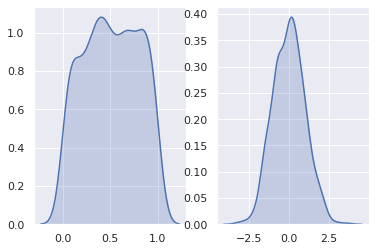

In [ ]:
fig,axs=plt.subplots(ncols=2)
sns.kdeplot(y,shade=True,ax=axs[0]);
sns.kdeplot(x,shade=True,ax=axs[1]);

In [ ]:
image = img.imread("img.jpg")

In [ ]:
image[:,:,0].shape

(625, 694)

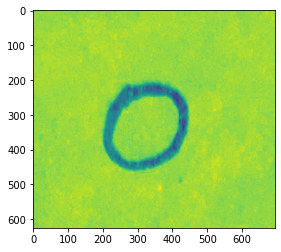

In [ ]:
plt.imshow(image[:,:,0])

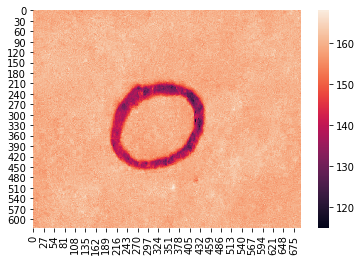

In [ ]:
sns.heatmap(image[:,:,0])

# Open ended task


In [ ]:
data=pd.read_excel("train.xlsx")

In [ ]:
data.shape

(3998, 39)

In [ ]:
data

,Unnamed: 0,ID,Salary,DOJ,DOL,Designation,JobCity,Gender,DOB,10percentage,10board,12graduation,12percentage,12board,CollegeID,CollegeTier,Degree,Specialization,collegeGPA,CollegeCityID,CollegeCityTier,CollegeState,GraduationYear,English,Logical,Quant,Domain,ComputerProgramming,ElectronicsAndSemicon,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience
0,train,203097,420000,2012-06-01,present,senior quality engineer,Bangalore,f,1990-02-19,84.30,"board ofsecondary education,ap",2007,95.80,"board of intermediate education,ap",1141,2,B.Tech/B.E.,computer engineering,78.00,1141,0,Andhra Pradesh,2011,515,585,525,0.635979,445,-1,-1,-1,-1,-1,-1,0.9737,0.8128,0.5269,1.35490,-0.4455
1,train,579905,500000,2013-09-01,present,assistant manager,Indore,m,1989-10-04,85.40,cbse,2007,85.00,cbse,5807,2,B.Tech/B.E.,electronics and communication engineering,70.06,5807,0,Madhya Pradesh,2012,695,610,780,0.960603,-1,466,-1,-1,-1,-1,-1,-0.7335,0.3789,1.2396,-0.10760,0.8637
2,train,810601,325000,2014-06-01,present,systems engineer,Chennai,f,1992-08-03,85.00,cbse,2010,68.20,cbse,64,2,B.Tech/B.E.,information technology,70.00,64,0,Uttar Pradesh,2014,615,545,370,0.450877,395,-1,-1,-1,-1,-1,-1,0.2718,1.7109,0.1637,-0.86820,0.6721
3,train,267447,1100000,2011-07-01,present,senior software engineer,Gurgaon,m,1989-12-05,85.60,cbse,2007,83.60,cbse,6920,1,B.Tech/B.E.,computer engineering,74.64,6920,1,Delhi,2011,635,585,625,0.974396,615,-1,-1,-1,-1,-1,-1,0.0464,0.3448,-0.3440,-0.40780,-0.9194
4,train,343523,200000,2014-03-01,2015-03-01 00:00:00,get,Manesar,m,1991-02-27,78.00,cbse,2008,76.80,cbse,11368,2,B.Tech/B.E.,electronics and communication engineering,73.90,11368,0,Uttar Pradesh,2012,545,625,465,0.124502,-1,233,-1,-1,-1,-1,-1,-0.8810,-0.2793,-1.0697,0.09163,-0.1295
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3993,train,47916,280000,2011-10-01,2012-10-01 00:00:00,software engineer,New Delhi,m,1987-04-15,52.09,cbse,2006,55.50,cbse,6268,2,B.Tech/B.E.,information technology,61.50,6268,0,Haryana,2010,365,334,475,0.276047,345,-1,-1,-1,-1,-1,-1,-0.1082,0.3448,0.2366,0.64980,-0.9194
3994,train,752781,100000,2013-07-01,2013-07-01 00:00:00,technical writer,Hyderabad,f,1992-08-27,90.00,state board,2009,93.00,state board,4883,2,B.Tech/B.E.,electronics and communication engineering,77.30,4883,1,Telangana,2013,415,410,535,0.881620,325,420,-1,-1,-1,-1,-1,-0.3027,0.8784,0.9322,0.77980,-0.0943
3995,train,355888,320000,2013-07-01,present,associate software engineer,Bangalore,m,1991-07-03,81.86,"bse,odisha",2008,65.50,"chse,odisha",9786,2,B.Tech/B.E.,computer engineering,70.00,9786,0,Orissa,2012,475,475,465,0.488348,405,-1,-1,-1,-1,-1,-1,-1.5765,-1.5273,-1.5051,-1.31840,-0.7615
3996,train,947111,200000,2014-07-01,2015-01-01 00:00:00,software developer,Asifabadbanglore,f,1992-03-20,78.72,state board,2010,69.88,state board,979,2,B.Tech/B.E.,computer science & engineering,70.42,979,1,Karnataka,2014,450,410,320,0.744758,445,-1,438,-1,-1,-1,-1,-0.1590,0.0459,-0.4511,-0.36120,-0.0943


In [ ]:
data.drop("Unnamed: 0",axis=1,inplace=True)

In [ ]:
data.head()

,ID,Salary,DOJ,DOL,Designation,JobCity,Gender,DOB,10percentage,10board,12graduation,12percentage,12board,CollegeID,CollegeTier,Degree,Specialization,collegeGPA,CollegeCityID,CollegeCityTier,CollegeState,GraduationYear,English,Logical,Quant,Domain,ComputerProgramming,ElectronicsAndSemicon,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience
0,203097,420000,2012-06-01,present,senior quality engineer,Bangalore,f,1990-02-19,84.3,"board ofsecondary education,ap",2007,95.8,"board of intermediate education,ap",1141,2,B.Tech/B.E.,computer engineering,78.00,1141,0,Andhra Pradesh,2011,515,585,525,0.635979,445,-1,-1,-1,-1,-1,-1,0.9737,0.8128,0.5269,1.35490,-0.4455
1,579905,500000,2013-09-01,present,assistant manager,Indore,m,1989-10-04,85.4,cbse,2007,85.0,cbse,5807,2,B.Tech/B.E.,electronics and communication engineering,70.06,5807,0,Madhya Pradesh,2012,695,610,780,0.960603,-1,466,-1,-1,-1,-1,-1,-0.7335,0.3789,1.2396,-0.10760,0.8637
2,810601,325000,2014-06-01,present,systems engineer,Chennai,f,1992-08-03,85.0,cbse,2010,68.2,cbse,64,2,B.Tech/B.E.,information technology,70.00,64,0,Uttar Pradesh,2014,615,545,370,0.450877,395,-1,-1,-1,-1,-1,-1,0.2718,1.7109,0.1637,-0.86820,0.6721
3,267447,1100000,2011-07-01,present,senior software engineer,Gurgaon,m,1989-12-05,85.6,cbse,2007,83.6,cbse,6920,1,B.Tech/B.E.,computer engineering,74.64,6920,1,Delhi,2011,635,585,625,0.974396,615,-1,-1,-1,-1,-1,-1,0.0464,0.3448,-0.3440,-0.40780,-0.9194
4,343523,200000,2014-03-01,2015-03-01 00:00:00,get,Manesar,m,1991-02-27,78.0,cbse,2008,76.8,cbse,11368,2,B.Tech/B.E.,electronics and communication engineering,73.90,11368,0,Uttar Pradesh,2012,545,625,465,0.124502,-1,233,-1,-1,-1,-1,-1,-0.8810,-0.2793,-1.0697,0.09163,-0.1295


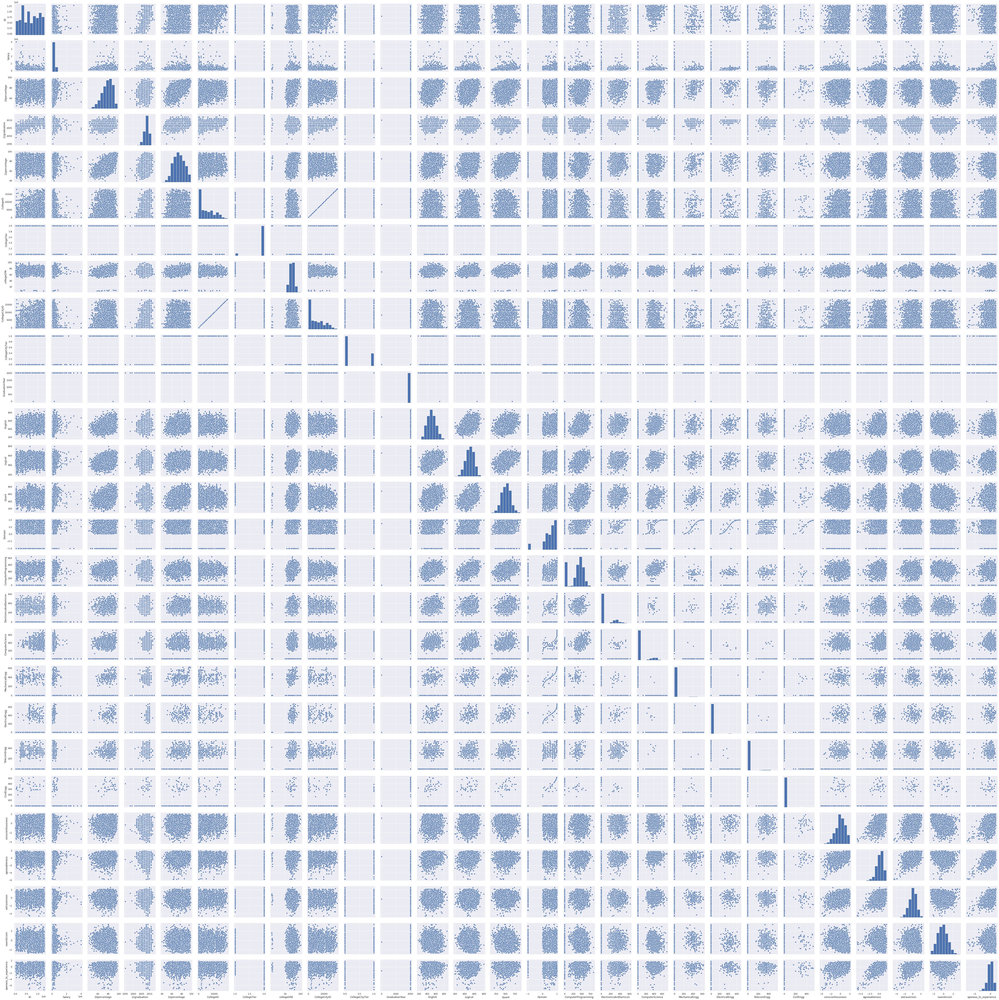

In [ ]:
sns.pairplot(data)

In [ ]:



d1=data[["Salary","12graduation"]]

In [ ]:
data.groupby("Gender")["Salary"].mean()

Gender
f    294937.304075
m    311716.211772
Name: Salary, dtype: float64

In [ ]:
sns.set(color_codes=True)

In [ ]:
data.Designation.unique()

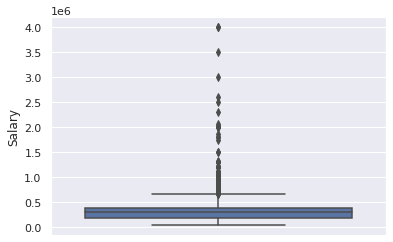

In [ ]:
sns.boxplot(x="Salary",data=data,hue="Gender",orient="v");

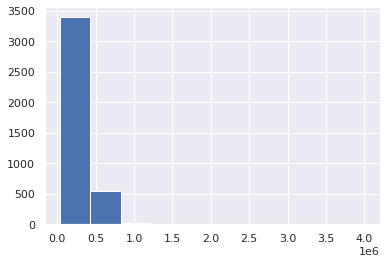

In [ ]:
plt.hist(data.Salary);

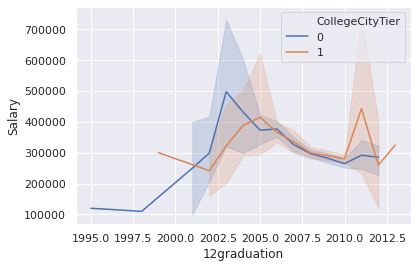

In [ ]:
sns.lineplot(x="12graduation",y="Salary",data=data,hue="CollegeCityTier");

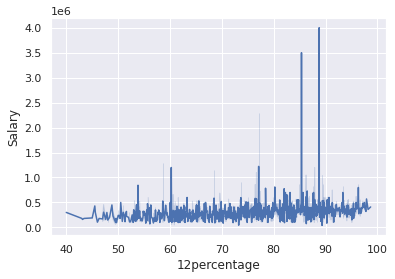

In [ ]:
sns.lineplot(x="12percentage",y="Salary",data=data);